I have used the following methods.

* I tried to implementation of distributed deep learning strategy,
* I used a pretrained ViT model for image feature extraction [1],
* Used <b>tf.data</b> and <b>Data Generator</b> for input pipeline,
* rectified and recreated functions in this notebook [2],


* <b><i> I tried a mirrored strategy of using 2 GPU at the same time in the training stage, but this gave rise to an infinite loop.</i></b>


## Prediction Pipeline
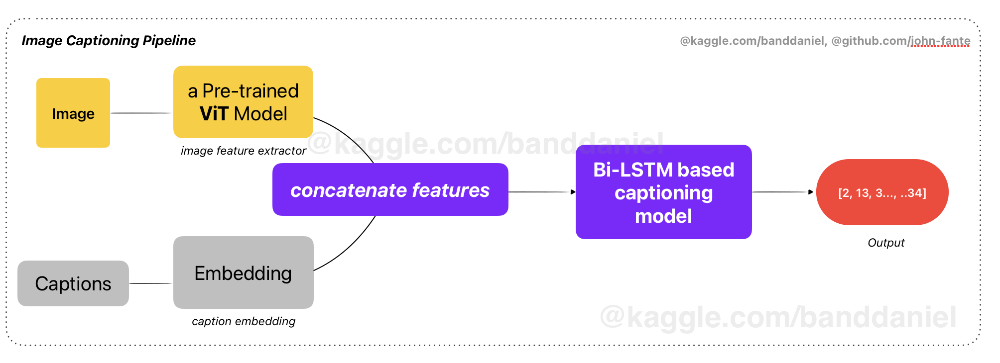


## Predictions
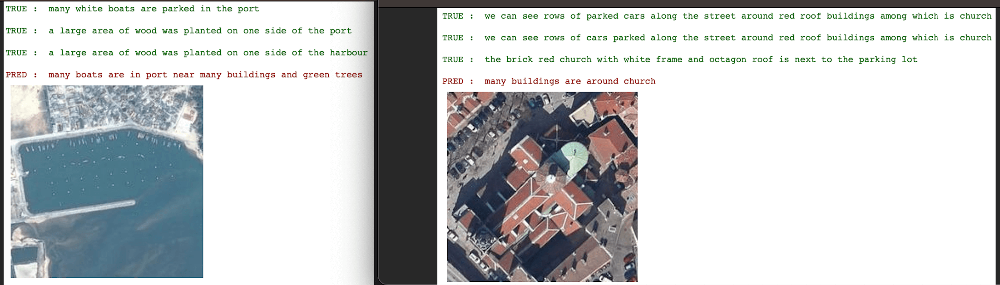

## My Another Projects
* [Diamond Detect w/Hybrid Model (ViT,CatBoost,SHAP)](https://www.kaggle.com/code/banddaniel/diamond-detect-w-hybrid-model-vit-catboost-shap)
* [Sign Detection w/Keras YOLO V8](https://www.kaggle.com/code/banddaniel/sign-detection-w-keras-yolo-v8)
* [Segment Medical Instrument, w/Custom DeepLabv3+(Dice: 0.86)](https://www.kaggle.com/code/banddaniel/segment-medical-instrument-deeplabv3-dice-0-86)


## References
1. https://github.com/faustomorales/vit-keras
2. https://www.kaggle.com/code/quadeer15sh/flickr8k-image-captioning-using-cnns-lstms

In [2]:
from IPython.display import clear_output
!pip install vit_keras
!pip install colorama
clear_output()

In [1]:
# Importing dependencies

import numpy as np
import pandas as pd
import os
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import re
from colorama import Fore, Back, Style
import cv2
import pickle

from vit_keras import vit
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import Sequence
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Layer, Input, Dropout, Flatten, Dense, Embedding, LSTM, add, Concatenate, Reshape, concatenate, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping


IMG_SIZE = 224
BATCH_SIZE = 64
SEED = 10
AUTO = tf.data.AUTOTUNE

In [2]:
image_path = '../input/flickr8k/'

train_data = pd.read_csv("../input/flickr8k/train.csv")
train_data['filepath'] = image_path + train_data['filepath'] 
# print( train_data['filepath'].iloc[0])
                                                                   
valid_data = pd.read_csv("../input/flickr8k/valid.csv")
valid_data['filepath'] = image_path + valid_data['filepath']

test_data = pd.read_csv("../input/flickr8k/test.csv")
test_data['filepath'] = image_path + test_data['filepath']

# <span style="color:#e74c3c;"> Text </span> Preprocessing

In [3]:
# the first stage 
def text_preprocessing(data):
    data['captions'] = data['captions'].apply(lambda x: x.replace("["," "))
    data['captions'] = data['captions'].apply(lambda x: x.replace("]"," "))
    data['captions'] = data['captions'].apply(lambda x: x.replace("''"," "))
    data['captions'] = data['captions'].apply(lambda x: x.lower())
    data['captions'] = data['captions'].apply(lambda x: x.replace("[^A-Za-z]"," "))
    data['captions'] = data['captions'].apply(lambda x: x.replace("\s+"," "))
    data['captions'] = data['captions'].apply(lambda x: " ".join([word for word in x.split() if len(word)>1]))

    return data

# splitting each caption (due to one image has many captions)
def splitting_captions(df):
    captions_arr = []
    filepaths_arr = []

    for i in range(df.shape[0]):
        img = df['filepath'].values[i]
        captions = re.split(r"' '", df['captions'].values[i])
        for caption in captions:
            captions_arr.append(caption)
            filepaths_arr.append(img)

    data = pd.DataFrame({'captions': captions_arr, 'filepath': filepaths_arr})

    return data

# the last stage and
def last_preprocessing(data):
    data['captions'] = data['captions'].apply(lambda x: x.replace("'",""))
    data['captions'] = data['captions'].apply(lambda x: x.replace(".",""))
    data['captions'] = "startseq "+data['captions']+" endseq"

    return data

In [4]:
# Applying text preprocessing functions

train_data_preprocessed = text_preprocessing(train_data)
train_data_preprocessed = splitting_captions(train_data_preprocessed)
train_data_new = last_preprocessing(train_data_preprocessed)

valid_data_preprocessed = text_preprocessing(valid_data)
valid_data_preprocessed = splitting_captions(valid_data_preprocessed)
valid_data_new = last_preprocessing(valid_data_preprocessed)

test_data_preprocessed = text_preprocessing(test_data)
test_data_preprocessed = splitting_captions(test_data_preprocessed)
test_data_new = last_preprocessing(test_data_preprocessed)


print('train shape -> ', train_data_new.shape[0])
print('valid shape -> ', valid_data_new.shape[0])
print('test shape -> ', test_data_new.shape[0])

train shape ->  25888
valid shape ->  3240
test shape ->  3236


In [5]:
# an example of training caption
train_data_new.iloc[SEED].captions

'startseq there is girl with pigtails sitting in front of rainbow painting endseq'

# <span style="color:#e74c3c;"> Caption </span> Tokenization

In [6]:
captions = train_data_new['captions'].tolist()

tokenizer = Tokenizer()
tokenizer.fit_on_texts(captions)
vocab_size = len(tokenizer.word_index) + 1
max_length = max(len(caption.split()) for caption in captions)

train_images = train_data_new['filepath'].unique().tolist()
train = train_data_preprocessed[train_data_preprocessed['filepath'].isin(train_images)]
train.reset_index(inplace=True,drop=True)

valid_images = valid_data_new['filepath'].unique().tolist()
valid = valid_data_preprocessed[valid_data_preprocessed['filepath'].isin(valid_images)]
valid.reset_index(inplace=True,drop=True)

test_images = test_data_new['filepath'].unique().tolist()
test = test_data_preprocessed[test_data_preprocessed['filepath'].isin(test_images)]
test.reset_index(inplace=True,drop=True)

# an example of tokenized caption
tokenizer.texts_to_sequences([captions[SEED]])[0]

[1, 166, 7, 22, 9, 1265, 48, 5, 50, 12, 1112, 855, 2]

# <span style="color:#e74c3c;"> ViT </span> Feature Extractor

In [7]:
vit_model = vit.vit_b16(image_size = IMG_SIZE, activation = 'softmax', weights="imagenet21k+imagenet2012",
                        pretrained = True, include_top = True, pretrained_top = True)
    
feature_extractor = Model(inputs=vit_model.input, outputs=vit_model.layers[-2].output)

# <span style="color:#e74c3c;"> Creating </span> tf.data Pipeline

In [8]:
# Reading -> Resizing -> Normalization
def img_preprocessing(img, caption):
    img = tf.io.read_file(img)
    img = tf.io.decode_jpeg(img, channels = 3)
    img = tf.image.resize(img, size = (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32) / 255.0

    # 9999 is a null class
    return img, 9999

In [9]:
# Creating dataset loader and tf.datasets
train_loader_for_img_features = tf.data.Dataset.from_tensor_slices((train['filepath'], train['captions']))
train_dataset_for_img_features = (train_loader_for_img_features
                                  .map(img_preprocessing, num_parallel_calls = AUTO)
                                  .batch(BATCH_SIZE)
                                  .prefetch(AUTO))


valid_loader_for_img_features = tf.data.Dataset.from_tensor_slices((valid['filepath'], valid['captions']))
valid_dataset_for_img_features = (valid_loader_for_img_features
                                  .map(img_preprocessing, num_parallel_calls = AUTO)
                                  .batch(BATCH_SIZE)
                                  .prefetch(AUTO))


test_loader_for_img_features = tf.data.Dataset.from_tensor_slices((test['filepath'], test['captions']))
test_dataset_for_img_features = (test_loader_for_img_features
                                 .map(img_preprocessing, num_parallel_calls = AUTO)
                                 .batch(BATCH_SIZE)
                                 .prefetch(AUTO))

In [10]:
def create_img_feature_dict(feature_extractor_model, tf_dataset, df):
    img_features = feature_extractor_model.predict(tf_dataset)
    features_dict = {}
    
    assert df.shape[0] == img_features.shape[0]
    for i in range(df.shape[0]):
        img_feature = tf.expand_dims(img_features[i], axis=0)
        features_dict[df['filepath'].iloc[i]] = img_feature
        
    return features_dict

In [11]:
# creating image features
train_img_features = create_img_feature_dict(feature_extractor, train_dataset_for_img_features, train)
valid_img_features = create_img_feature_dict(feature_extractor, valid_dataset_for_img_features, valid)
test_img_features = create_img_feature_dict(feature_extractor, test_dataset_for_img_features, test)

51/51 [==============================] - 10030s 200s/step


# <span style="color:#e74c3c;"> Creating </span> Sequence Generator

In [12]:
class CustomDataGenerator(Sequence):

    def __init__(self, df, batch_size, tokenizer, vocab_size, max_length, features, shuffle=True, **kwargs):
        super(CustomDataGenerator, self).__init__(**kwargs)
        self.df = df.copy()
        self.batch_size = batch_size
        self.tokenizer = tokenizer
        self.vocab_size = vocab_size
        self.max_length = max_length
        self.features = features
        self.shuffle = shuffle
        self.n = len(self.df)

    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)

    def __len__(self):
        return self.n // self.batch_size

    def __getitem__(self,index):

        batch = self.df.iloc[index * self.batch_size:(index + 1) * self.batch_size,:]
        X1, X2, y = self.__get_data(batch)
        return (X1, X2), y

    def __get_data(self,batch):

        X1, X2, y = list(), list(), list()

        images = batch['filepath'].tolist()

        for image in images:
            feature = self.features[image][0]

            captions = batch.loc[batch['filepath']== image, 'captions'].tolist()
            for caption in captions:
                seq = self.tokenizer.texts_to_sequences([caption])[0]

                for i in range(1,len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=self.max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=self.vocab_size)[0]
                    X1.append(feature)
                    X2.append(in_seq)
                    y.append(out_seq)

        X1, X2, y = np.array(X1), np.array(X2), np.array(y)


        return X1, X2, y

In [13]:
# creating generators
train_generator = CustomDataGenerator(df = train_data_new, batch_size = BATCH_SIZE, tokenizer = tokenizer,vocab_size = vocab_size,
                                      max_length = max_length, features = train_img_features)

valid_generator = CustomDataGenerator(df = valid_data_new,batch_size = BATCH_SIZE, tokenizer=tokenizer,vocab_size=vocab_size,
                                      max_length = max_length, features = valid_img_features, shuffle = False)


test_generator = CustomDataGenerator(df = test_data_new, batch_size = BATCH_SIZE, tokenizer = tokenizer, vocab_size=vocab_size,
                                     max_length = max_length, features = test_img_features, shuffle = False)

# <span style="color:#e74c3c;"> Creating </span> Sequence Generator

In [ ]:
input1 = Input(shape=(768,))
input2 = Input(shape=(max_length,))

img_features = Dense(512, activation='relu')(input1)
img_features_reshaped = Reshape((1, 512), input_shape=(512,))(img_features)

sentence_features = Embedding(vocab_size, 512, mask_zero=False)(input2)
merged = concatenate([img_features_reshaped,sentence_features],axis=1)
sentence_features = Bidirectional(LSTM(256, dropout=0.1))(merged)

X = Dropout(0.5)(sentence_features)
X = add([X, img_features])
X = Dense(128, activation='relu')(X)
X = Dropout(0.5)(X)
output = Dense(vocab_size, activation='softmax')(X)

caption_model = Model(inputs=[input1,input2], outputs=output)
caption_model.compile(loss='categorical_crossentropy',
                          optimizer=tf.optimizers.AdamW(learning_rate=0.001, weight_decay=0.004), 
                          metrics=['acc'])

caption_model.summary()

In [15]:
# training
hist = caption_model.fit(train_generator,epochs = 10, validation_data = valid_generator, 
                         callbacks = [EarlyStopping(monitor='val_loss', min_delta = 0, patience = 2, restore_best_weights = True)])

Epoch 1/10


  2/404 [..............................] - ETA: 1:25:56 - loss: 8.9065 - acc: 5.5269e-04

: 

In [ ]:
caption_model = pickle

In [18]:
# test evaluation
test_eval = caption_model.evaluate(test_generator)

50/50 [==============================] - 148s 3s/step - loss: 3.4478 - acc: 0.3403


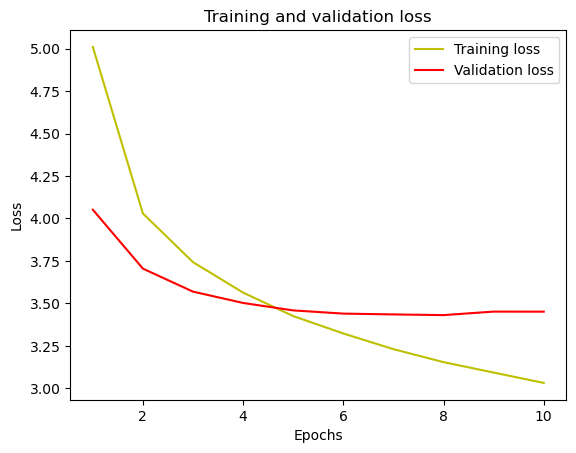

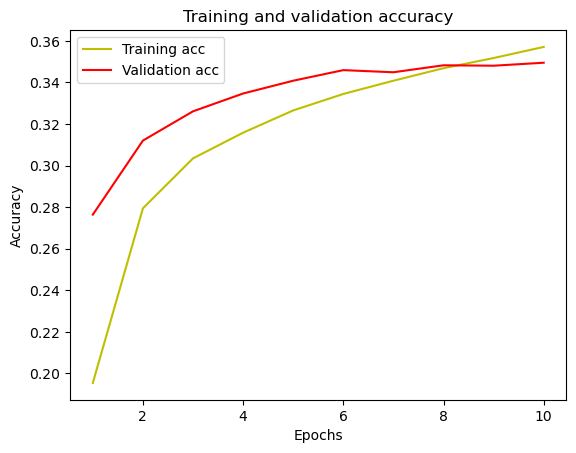

In [19]:
loss = hist.history['loss']
val_loss = hist.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


acc = hist.history['acc']
val_acc = hist.history['val_acc']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [20]:
def idx_to_word(integer,tokenizer):

    for word, index in tokenizer.word_index.items():
        if index==integer:
            return word
    return None


# prediction function
def predict_caption(model, image, tokenizer, max_length, features):

    feature = features[image]
    in_text = 'startseq'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)

        y_pred_ = model.predict([feature,sequence], verbose = 0)
        y_pred = np.argmax(y_pred_)

        word = idx_to_word(y_pred, tokenizer)

        if word is None:
            break

        in_text+= " " + word
        if word == 'endseq':
            break

    return in_text, y_pred_, y_pred

# <span style="color:#e74c3c;"> Test </span> Predictions

In [21]:
# 50 random samples from test dataset
samples = test.sample(1000)
samples.reset_index(drop=True,inplace=True)

# test predictions
for index, record in samples.iterrows():
    image_path = image_path + '/'
    img = load_img(record['filepath'], target_size=(224,224))
    img = img_to_array(img)
    img = img/255.

    caption = predict_caption(caption_model, record['filepath'], tokenizer, max_length, test_img_features)
    samples.loc[index,'captions'] = caption

In [27]:
# a function for displaying a sample, true captions and theprediction caption

def display_prediction_images(temp_df, SEED):
    temp_df = temp_df.reset_index(drop=True)
    # plt.figure(figsize = (5,5))

    idx = np.random.default_rng(seed=SEED).permutation(temp_df.shape[0])[0]
    img = cv2.imread(temp_df.iloc[idx]['filepath'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    true_captions = test.loc[test['filepath']== temp_df.filepath[idx], 'captions'].tolist()[:5]

    pred_caption = temp_df.iloc[idx]['captions'][0]
    pred_caption = pred_caption.replace('startseq ', '')
    pred_caption = pred_caption.replace(' endseq', '')


    for true_caption in true_captions:
        true_caption = true_caption.replace('startseq ', '')
        true_caption = true_caption.replace(' endseq', '')
        print(Fore.GREEN + "TRUE : " + true_caption + '\n')

 
    print(Fore.RED + "PRED : "+ pred_caption)


    # plt.imshow(img)
    # plt.axis('off')

    return pred_caption

In [1]:
display_prediction_images(samples, 700)

NameError: name 'display_prediction_images' is not defined

In [ ]:
from nltk.translate.bleu_score import sentence_bleu

metric_check = samples
metric_check = metric_check.reset_index(drop=True)
MOD = 1e9 + 7
bleu1 = 0
bleu2 = 0
bleu3 = 0
bleu4 = 0
length = 1

for SEED in range (0, length):
    idx = np.random.default_rng(seed=SEED).permutation(metric_check.shape[0])[0]
    img = cv2.imread(metric_check.iloc[idx]['filepath'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    true_captions = test.loc[test['filepath']== metric_check.filepath[idx], 'captions'].tolist()[:5]
    actual = []

    for caption in true_captions:
        caption = caption.replace('startseq ', '')
        caption = caption.replace(' endseq', '')
        caption = caption.split()
        actual.append(caption)


    predicted = display_prediction_images(samples, SEED)
    predicted = predicted.split()
    b1 = sentence_bleu(actual, predicted, weights=(1,0,0,0))
    b2 = sentence_bleu(actual, predicted, weights=(0.5,0.5,0,0))
    b3 = sentence_bleu(actual, predicted, weights=(0.3,0.3,0.3,0))
    b4 = sentence_bleu(actual, predicted, weights=(0.25,0.25,0.25,0.25))
    bleu1 = (bleu1 + b1) % MOD
    bleu2 = (bleu2 + b2) % MOD
    bleu3 = (bleu3 + b3) % MOD
    bleu4 = (bleu4 + b4) % MOD

print(f"BLEU-1 score: {(bleu1 / length) * 100}")
print(f"BLEU-2 score: {(bleu2 / length) * 100}")
print(f"BLEU-3 score: {(bleu3 / length) * 100}")
print(f"BLEU-4 score: {(bleu4 / length) * 100}")

TRUE : a little girl is sitting on santa s l

TRUE : a man dressed as santa clause with little girl in his lap

TRUE : a young girl is sitting on santa s lap

TRUE : santa claus with young girl in black print dress in his lap

PRED : a woman in red shirt is sitting on the floor
BLEU-1 score: 50.0
BLEU-2 score: 33.33333333333333
BLEU-3 score: 27.720448401281438
BLEU-4 score: 4.1927887725759644e-76


TRUE : a boy in red coat holds huge ball of snow

TRUE : a child outside with snow

TRUE : a child wearing red coat and cap is holding large chunk of snow

TRUE : the boy in the red hat and jacket is carrying huge lump of snow

PRED : a child in red jacket is standing in the snow
TRUE : a girl in black cape with group of other childr

TRUE : a girl in cape along with other costumed childr

TRUE : a group of children dressed for halloween stand in line with the exception of one girl

TRUE : children in costumes standing in line

PRED : a woman in red shirt is holding her head
TRUE : a skateboarder in black brown and white is grinding his skateboard along low ra

TRUE : a young man rides skateboard along metal pole

TRUE : the skater rides his board on the pipe

TRUE : the young man is riding skateboard and performing trick

PRED : a man is sitting on the sidewalk
TRUE : two dogs in yard

TRUE : two dogs run around inside fence

TRUE : two dogs standing in the grass one is running

TRUE 

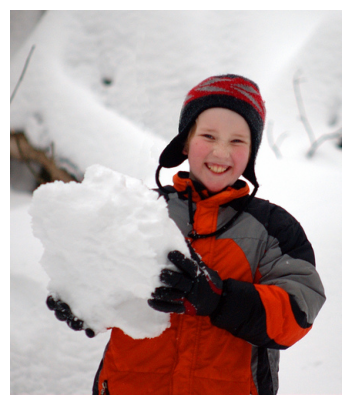

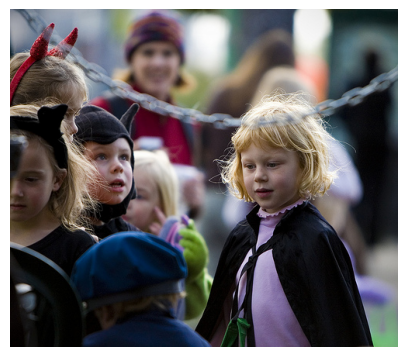

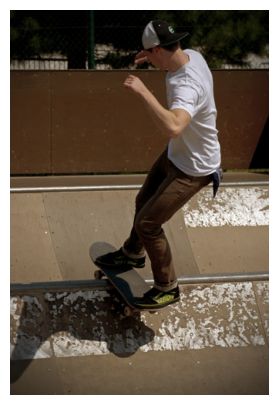

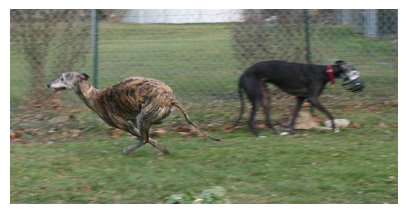

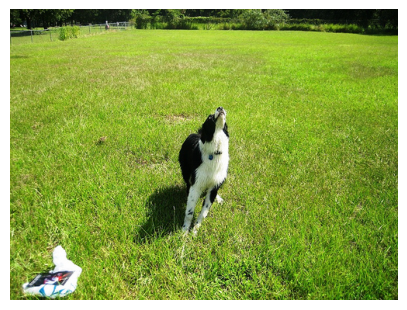

...

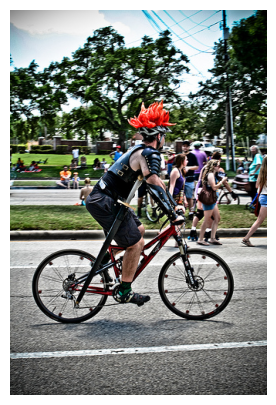

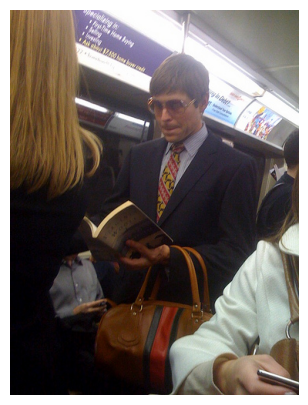

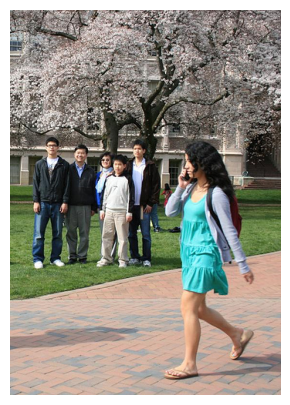

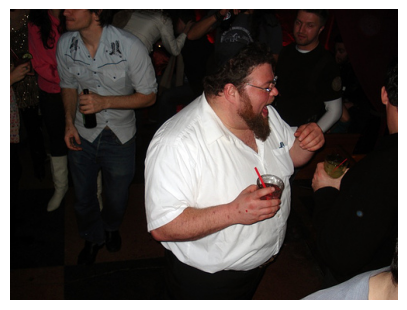

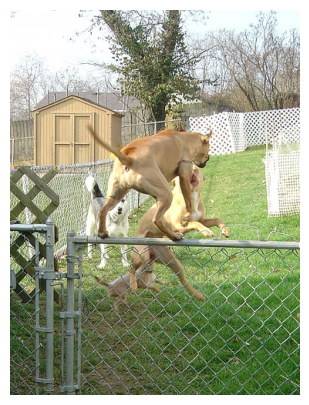

In [30]:
from nltk.translate.meteor_score import meteor_score

meteor = 0
length = 50

for SEED in range (0, length):
    idx = np.random.default_rng(seed=SEED).permutation(metric_check.shape[0])[0]
    img = cv2.imread(metric_check.iloc[idx]['filepath'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    true_captions = test.loc[test['filepath']== metric_check.filepath[idx], 'captions'].tolist()[:5]
    actual = []

    for caption in true_captions:
        caption = caption.replace('startseq ', '')
        caption = caption.replace(' endseq', '')
        caption = caption.split()
        actual.append(caption)


    predicted = display_prediction_images(samples, SEED)
    predicted = predicted.split()
    m = meteor_score(actual, predicted)
    meteor = (meteor + m) % MOD

print(f"METEOR score: {(meteor / length) * 100}")